# Data Science Intern @CodersCave Nov23
# Author: Viraj N. Bhutada
# *Phase 1 (Golden Task): Breast Cancer Prediction*

**Problem Statement**:
The objective of this project is to create a predictive model that can accurately classify breast
cancer cases as benign or malignant based on a set of relevant features. By leveraging
historical data and applying machine learning techniques, we aim to develop a reliable tool for
assisting medical professionals in diagnosing breast cancer.



# Project Summary -

Breast cancer, a significant health concern, poses life-threatening risks. This project is dedicated to creating a predictive model aimed at early breast cancer diagnosis, a crucial factor in effective treatment and improved patient outcomes.

**Project Objective:**

Our primary goal is to develop a precise predictive model capable of classifying breast tumors as benign or malignant. Through the meticulous analysis of patient data and tumor characteristics, we aim to empower medical professionals with essential information for making well-informed decisions about patient care.

**Dataset:**

We utilize an extensive dataset comprising medical features extracted from breast cancer biopsies. These features encompass critical details such as tumor size, cell shape, and mitotic count. Each record is meticulously labeled as benign or malignant.

**Methodology:**

1. **Data Preprocessing:** Rigorous data preprocessing is conducted, addressing missing values, scaling, and encoding categorical variables for comprehensive analysis.

2. **Model Development:** We employ a range of machine learning algorithms to develop and train predictive models, ensuring robustness and accuracy.

3. **Model Evaluation:** The models are rigorously evaluated using metrics including accuracy, precision, recall, and F1-score to gauge their effectiveness.

**Results and Impact:**

The successful creation of our breast cancer prediction model holds transformative potential for the healthcare landscape. Early diagnosis facilitated by our model can significantly enhance treatments and patient outcomes. This project stands as a pivotal contribution to medical data analysis, emphasizing the value of data-driven approaches in shaping the future of healthcare.

Our dedicated focus on early breast cancer diagnosis exemplifies the power of data-driven methodologies in healthcare. By enabling timely and precise breast cancer diagnoses, our work not only saves lives but also elevates the standard of patient care. This project serves as a testament to the transformative impact of data-driven solutions in addressing critical real-world health challenges.

**Dataset link**: https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data/data

# Problem Statement


Breast cancer, a significant global concern, requires early detection for effective treatment. This project focuses on building a precise predictive model to aid medical professionals in timely and accurate breast cancer diagnosis. Key challenges include addressing data complexity, ensuring high accuracy, and enabling the model's real-world application. The objective is to develop a universally applicable, reliable, and accessible tool for early breast cancer detection, ultimately improving patient care.

# Initiating Exploration!

### Import Libraries

In [33]:
# Import Libraries
import pandas as pd
import numpy as np
from datetime import datetime as dt


# Import Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.impute import KNNImputer
from sklearn.feature_selection import chi2

# Import evaluation metric libraries
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report

# Import preprocessing libraries
from sklearn.preprocessing import StandardScaler

# Import Model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import RepeatedStratifiedKFold
import xgboost as xgb

# Import model selection libraries
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

# Import warnings
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# Load Dataset
import pandas as pd
df = pd.read_csv('breastcancerdata.csv')

### Dataset First View

In [ ]:
# Dataset First Look
# View top 5 rows of the dataset
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
# View last 5 rows of the dataset
df.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
# Checking number of rows and columns of the dataset using shape
print("Number of rows are: ",df.shape[0])
print("Number of columns are: ",df.shape[1])

Number of rows are:  569
Number of columns are:  33


### Dataset Information

In [ ]:
# Dataset Info
# Checking information about the dataset using info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

#### Duplicate Values

In [ ]:
# Checking Dataset Duplicate Value Count
df.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Checking missing values/null values count for each column
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

<Axes: >

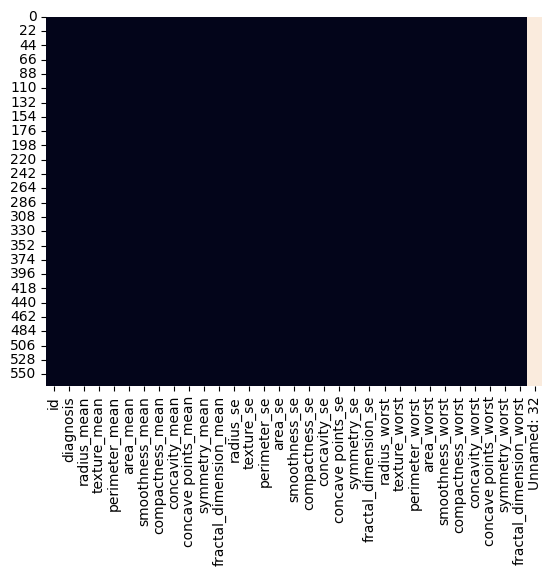

In [ ]:
# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(df.isnull(), cbar=False)

### What did you know about your dataset?

There are a total of 33 feature columns where 'diagnosis' is the dependent variable column.

The total number of observations(rows) are 569.

There are no duplicate rows in the dataset.

Also there are missing values in the column 'unnamed: 32'.

## **2. Understanding Your Variables**

In [ ]:
# Dataset Columns
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [ ]:
# Dataset Describe (all columns included)
df.describe(include= 'all').round(2)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,...,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,569.00,0.0
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3.037183e+07,NaN,14.13,19.29,91.97,654.89,0.10,0.10,0.09,0.05,...,25.68,107.26,880.58,0.13,0.25,0.27,0.11,0.29,0.08,NaN
std,1.250206e+08,NaN,3.52,4.30,24.30,351.91,0.01,0.05,0.08,0.04,...,6.15,33.60,569.36,0.02,0.16,0.21,0.07,0.06,0.02,NaN
min,8.670000e+03,NaN,6.98,9.71,43.79,143.50,0.05,0.02,0.00,0.00,...,12.02,50.41,185.20,0.07,0.03,0.00,0.00,0.16,0.06,NaN
25%,8.692180e+05,NaN,11.70,16.17,75.17,420.30,0.09,0.06,0.03,0.02,...,21.08,84.11,515.30,0.12,0.15,0.11,0.06,0.25,0.07,NaN
50%,9.060240e+05,NaN,13.37,18.84,86.24,551.10,0.10,0.09,0.06,0.03,...,25.41,97.66,686.50,0.13,0.21,0.23,0.10,0.28,0.08,NaN
75%,8.813129e+06,NaN,15.78,21.80,104.10,782.70,0.11,0.13,0.13,0.07,...,29.72,125.40,1084.00,0.15,0.34,0.38,0.16,0.32,0.09,NaN


### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable using a for loop
for i in df.columns.tolist():
  print("No. of unique values in",i,"is",df[i].nunique())

No. of unique values in id is 569
No. of unique values in diagnosis is 2
No. of unique values in radius_mean is 456
No. of unique values in texture_mean is 479
No. of unique values in perimeter_mean is 522
No. of unique values in area_mean is 539
No. of unique values in smoothness_mean is 474
No. of unique values in compactness_mean is 537
No. of unique values in concavity_mean is 537
No. of unique values in concave points_mean is 542
No. of unique values in symmetry_mean is 432
No. of unique values in fractal_dimension_mean is 499
No. of unique values in radius_se is 540
No. of unique values in texture_se is 519
No. of unique values in perimeter_se is 533
No. of unique values in area_se is 528
No. of unique values in smoothness_se is 547
No. of unique values in compactness_se is 541
No. of unique values in concavity_se is 533
No. of unique values in concave points_se is 507
No. of unique values in symmetry_se is 498
No. of unique values in fractal_dimension_se is 545
No. of unique val

## **3. Data Wrangling**

### Data Wrangling Code

In [ ]:
# Getting mean columns with diagnosis
m_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

In [ ]:
# Getting se columns with diagnosis
s_col = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']

In [ ]:
# Getting worst columns with diagnosis
w_col = ['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

In [ ]:
m_col

['diagnosis',
 'radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean',
 'fractal_dimension_mean']

In [ ]:
s_col

['diagnosis',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'concave points_se',
 'symmetry_se',
 'fractal_dimension_se']

In [ ]:
w_col

['diagnosis',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'smoothness_worst',
 'compactness_worst',
 'concavity_worst',
 'concave points_worst',
 'symmetry_worst',
 'fractal_dimension_worst']

### What all manipulations have you done and insights you found?

Defined the mean columns, se columns and worst columns for ease of plotting graphs.

## **4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables**

#### Chart - 1 : Dependent variable Distribution

B    357
M    212
Name: diagnosis, dtype: int64
 


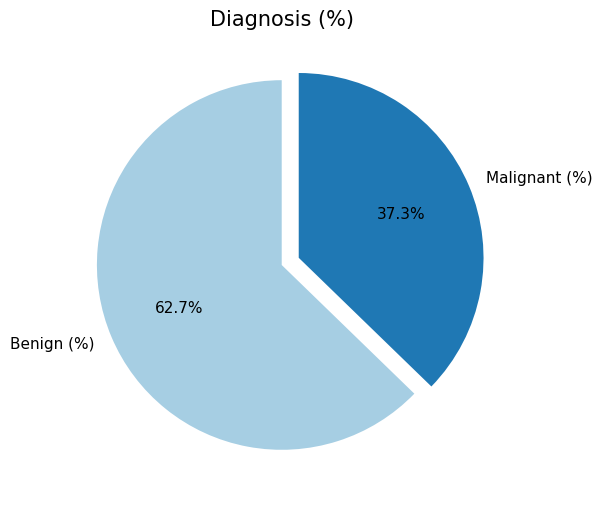

In [ ]:
# Chart - 1 Visualization code for Distribution of dependent varaible - diagnosis

# Dependant Column Value Counts
print(df.diagnosis.value_counts())
print(" ")

# Color palette selection
colors = sns.color_palette("Paired")

# Plotting data on chart
plt.figure(figsize=(10,6))
explode = [0,0.1]
textprops = {'fontsize':11}
plt.pie(df['diagnosis'].value_counts(), labels=['Benign (%)','Malignant (%)'], startangle=90, colors=colors, explode = explode, autopct="%1.1f%%",textprops = textprops)
plt.title('Diagnosis (%)', fontsize=15)

# Displaying chart
plt.show()

##### What is/are the insight(s) found from the chart?

From the above chart we come to know that approximately 37.3% of the cases (212 out of 569) indicate the presence of malignant cancer, while the remaining 62.7% (357 out of 569) are classified as benign, indicating the absence of cancer.

#### Chart - 2 : Correlation Heatmap

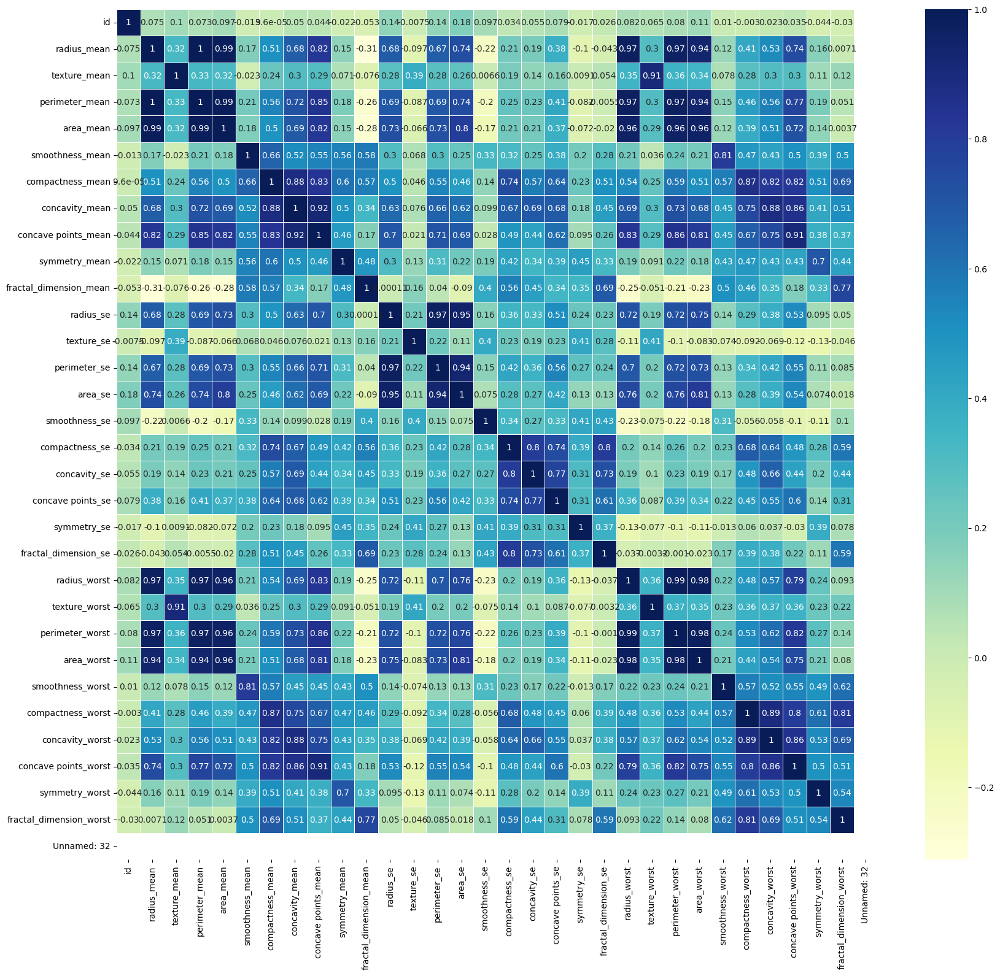

In [ ]:
# Correlation Heatmap visualization code
# Create a figure with a specific size for the heatmap
plt.figure(figsize=(20,18))

# Generate a correlation heatmap for the selected data
sns.heatmap(df.corr(),annot=True,linewidths=.5,cmap="YlGnBu")

# Display the heatmap
plt.show()

#### Chart - 3 : Pair Plot

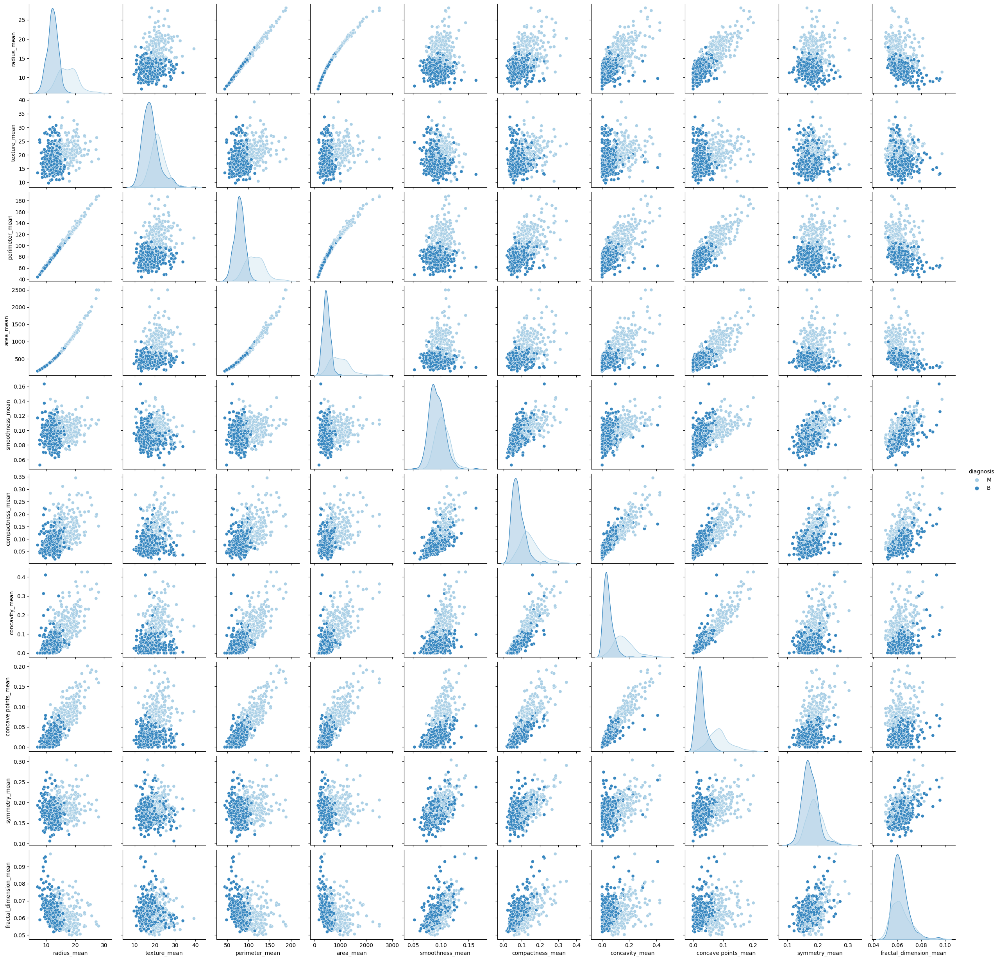

In [ ]:
# Pairplot for mean columns
sns.pairplot(df[m_col], hue='diagnosis', palette='Blues')

# Display Chart
plt.show()

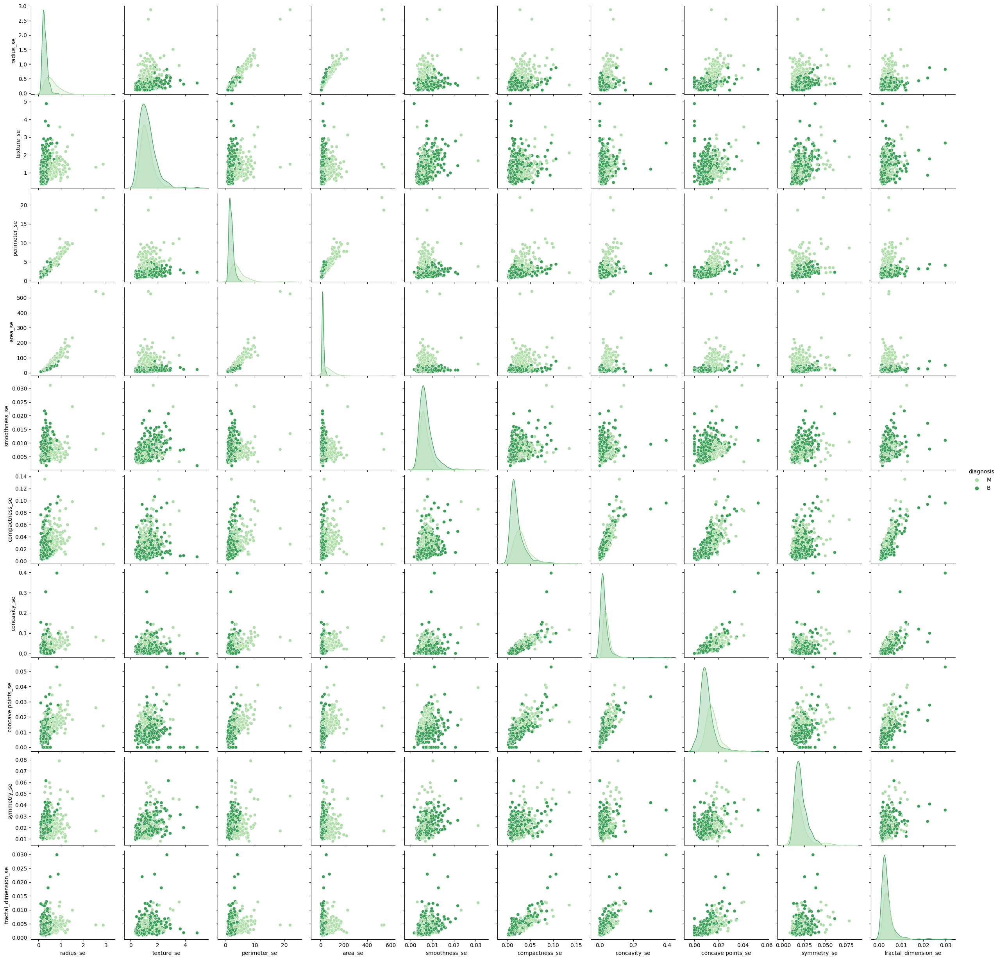

In [ ]:
# Pairplot for se columns
sns.pairplot(df[s_col], hue='diagnosis', palette='Greens')

# Display Chart
plt.show()

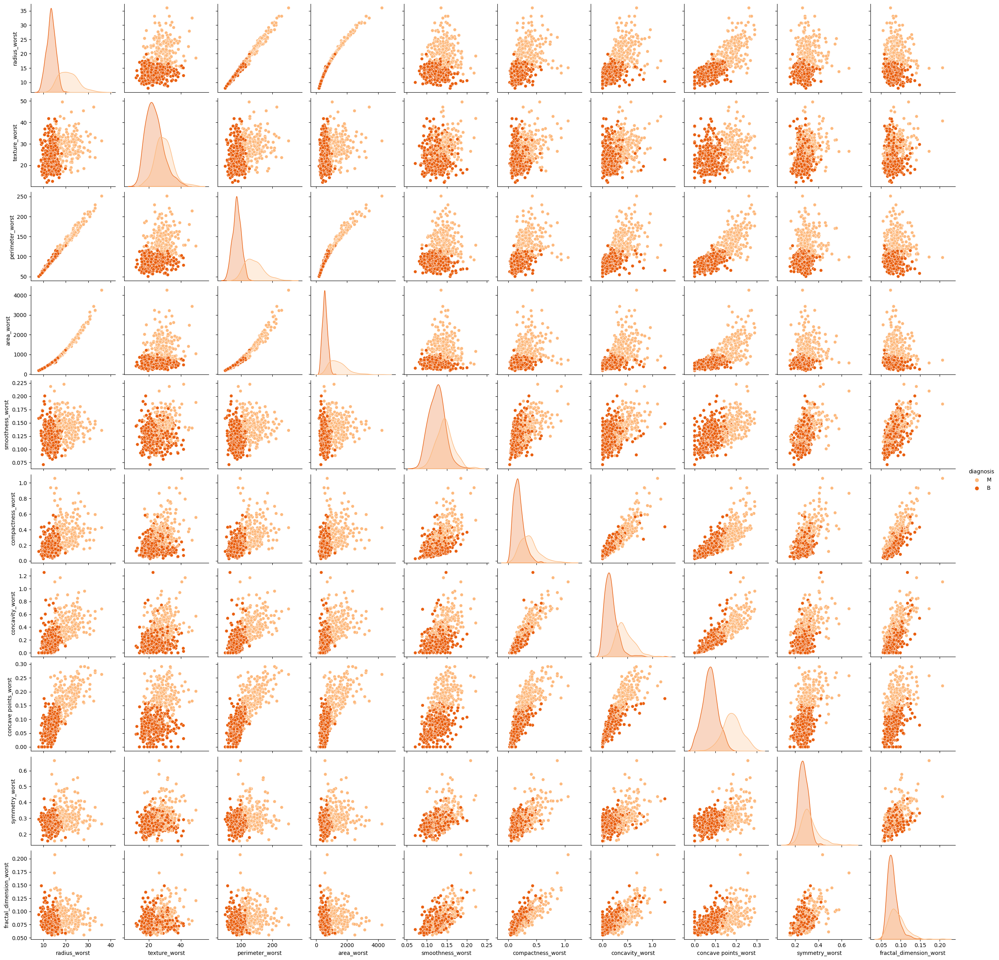

In [ ]:
# Pairplot for worst columns
sns.pairplot(df[w_col], hue='diagnosis', palette='Oranges')

# Display Chart
plt.show()

# **5. Feature Engineering & Data Pre-processing**

### 1. Handling Missing Values

#### Unnamed: 32

In [ ]:
# Dropping Unnamed: 32 column
df.drop("Unnamed: 32",axis=1, inplace=True)

### 2. Categorical Encoding

In [ ]:
# Encoding the categorical column
df['diagnosis']=df['diagnosis'].map({'B':0,'M':1})

#### What all categorical encoding techniques i have used & why did i use those techniques?

One hot encoding is used to encode the diagnosis column. Converted malignan as 1 and benign as 0.

### 3. Feature Selection

In [ ]:
# Select features wisely to avoid overfitting
# Dropping id column
df.drop("id",axis=1, inplace=True)

In [ ]:
# Updated columns
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

### 4. Data Splitting

In [ ]:
# Defining the X and y
X = df.drop('diagnosis',axis=1)
y = df['diagnosis']

In [ ]:
# Splitting the data into training and testing sets
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Checking the train distribution of dependent variable
y_train.value_counts()

0    286
1    169
Name: diagnosis, dtype: int64

### 5. Data Scaling

In [ ]:
# Create a StandardScaler object to standardize the data
scaler = StandardScaler()

# Apply the StandardScaler to the training data (X_train) to standardize it
X_train = scaler.fit_transform(X_train)

# Apply the same standardization to the testing data (X_test) to maintain consistency
X_test = scaler.transform(X_test)

 # **6. ML Model Implementation**

In [28]:
def evaluate_model(model, X_train, X_test, y_train, y_test):
    '''The function will take model, x train, x test, y train, y test
    and then it will fit the model, then make predictions on the trained model,
    it will then print roc-auc score of train and test, then plot the roc, auc curve,
    print confusion matrix for train and test, then print classification report for train and test,
    then plot the feature importances if the model has feature importances,
    and finally it will return the following scores as a list:
    recall_train, recall_test, acc_train, acc_test, roc_auc_train, roc_auc_test, F1_train, F1_test
    '''

    # fit the model on the training data
    model.fit(X_train, y_train)

    # make predictions on the test data
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    pred_prob_train = model.predict_proba(X_train)[:,1]
    pred_prob_test = model.predict_proba(X_test)[:,1]

    # calculate ROC AUC score
    roc_auc_train = roc_auc_score(y_train, y_pred_train)
    roc_auc_test = roc_auc_score(y_test, y_pred_test)
    print("\nTrain ROC AUC:", roc_auc_train)
    print("Test ROC AUC:", roc_auc_test)

    # plot the ROC curve
    fpr_train, tpr_train, thresholds_train = roc_curve(y_train, pred_prob_train)
    fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test)
    plt.plot([0,1],[0,1],'k--')
    plt.plot(fpr_train, tpr_train, label="Train ROC AUC: {:.2f}".format(roc_auc_train))
    plt.plot(fpr_test, tpr_test, label="Test ROC AUC: {:.2f}".format(roc_auc_test))
    plt.legend()
    plt.title("ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.show()

    # calculate confusion matrix
    cm_train = confusion_matrix(y_train, y_pred_train)
    cm_test = confusion_matrix(y_test, y_pred_test)

    fig, ax = plt.subplots(1, 2, figsize=(11,4))

    print("\nConfusion Matrix:")
    sns.heatmap(cm_train, annot=True, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'], cmap="Oranges", fmt='.4g', ax=ax[0])
    ax[0].set_xlabel("Predicted Label")
    ax[0].set_ylabel("True Label")
    ax[0].set_title("Train Confusion Matrix")

    sns.heatmap(cm_test, annot=True, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'], cmap="Oranges", fmt='.4g', ax=ax[1])
    ax[1].set_xlabel("Predicted Label")
    ax[1].set_ylabel("True Label")
    ax[1].set_title("Test Confusion Matrix")

    plt.tight_layout()
    plt.show()


    # calculate classification report
    cr_train = classification_report(y_train, y_pred_train, output_dict=True)
    cr_test = classification_report(y_test, y_pred_test, output_dict=True)
    print("\nTrain Classification Report:")
    crt = pd.DataFrame(cr_train).T
    print(crt.to_markdown())
    # sns.heatmap(pd.DataFrame(cr_train).T.iloc[:, :-1], annot=True, cmap="Blues")
    print("\nTest Classification Report:")
    crt2 = pd.DataFrame(cr_test).T
    print(crt2.to_markdown())
    # sns.heatmap(pd.DataFrame(cr_test).T.iloc[:, :-1], annot=True, cmap="Blues")

    precision_train = cr_train['weighted avg']['precision']
    precision_test = cr_test['weighted avg']['precision']

    recall_train = cr_train['weighted avg']['recall']
    recall_test = cr_test['weighted avg']['recall']

    acc_train = accuracy_score(y_true = y_train, y_pred = y_pred_train)
    acc_test = accuracy_score(y_true = y_test, y_pred = y_pred_test)

    F1_train = cr_train['weighted avg']['f1-score']
    F1_test = cr_test['weighted avg']['f1-score']

    model_score = [precision_train, precision_test, recall_train, recall_test, acc_train, acc_test, roc_auc_train, roc_auc_test, F1_train, F1_test ]
    return model_score

In [29]:
# Create a score dataframe
score = pd.DataFrame(index = ['Precision Train', 'Precision Test','Recall Train','Recall Test','Accuracy Train', 'Accuracy Test','ROC-AUC Train', 'ROC-AUC Test','F1 macro Train', 'F1 macro Test'])

### ML Model - 1 : Logistic regression

In [30]:
# ML Model - 1 Implementation
lr_model = LogisticRegression(fit_intercept=True, max_iter=10000)

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 0.9846691769768692
Test ROC AUC: 0.9697019325253848


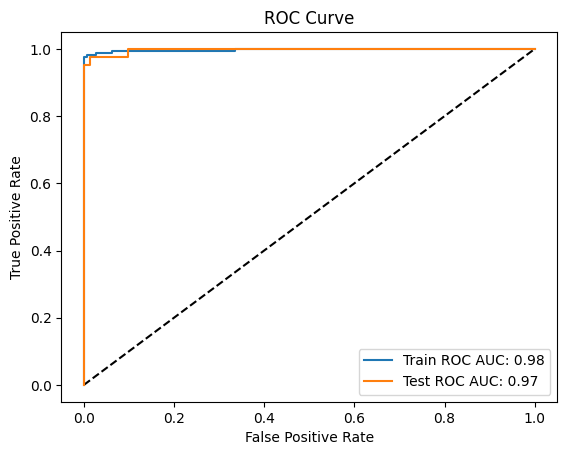


Confusion Matrix:


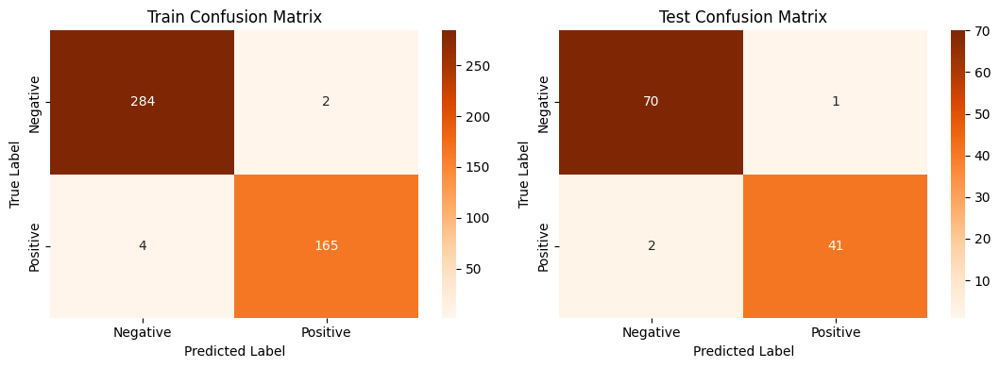


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.986111 | 0.993007 |   0.989547 | 286        |
| 1            |    0.988024 | 0.976331 |   0.982143 | 169        |
| accuracy     |    0.986813 | 0.986813 |   0.986813 |   0.986813 |
| macro avg    |    0.987068 | 0.984669 |   0.985845 | 455        |
| weighted avg |    0.986822 | 0.986813 |   0.986797 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.972222 | 0.985915 |   0.979021 |  71        |
| 1            |    0.97619  | 0.953488 |   0.964706 |  43        |
| accuracy     |    0.973684 | 0.973684 |   0.973684 |   0.973684 |
| macro avg    |    0.974206 | 0.969702 |   0.971863 | 114        |
| weighted avg |    0.973719 | 0.973684 |   0.973621 | 11

In [34]:
# Visualizing evaluation Metric Score chart
lr_score = evaluate_model(lr_model, X_train, X_test, y_train, y_test)

In [35]:
# Updated Evaluation metric Score Chart
score['Logistic regression'] = lr_score
score

,Logistic regression
Precision Train,0.986822
Precision Test,0.973719
Recall Train,0.986813
Recall Test,0.973684
Accuracy Train,0.986813
Accuracy Test,0.973684
ROC-AUC Train,0.984669
ROC-AUC Test,0.969702
F1 macro Train,0.986797
F1 macro Test,0.973621


#### 2. Cross- Validation & Hyperparameter Tuning

In [36]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
param_grid = {'C': [100,10,1,0.1,0.01,0.001,0.0001],
              'penalty': ['l1', 'l2'],
              'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

# Initializing the logistic regression model
logreg = LogisticRegression(fit_intercept=True, max_iter=10000, random_state=0)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=4, random_state=0)

# Using GridSearchCV to tune the hyperparameters using cross-validation
grid = GridSearchCV(logreg, param_grid, cv=rskf)
grid.fit(X_train, y_train)

# Select the best hyperparameters found by GridSearchCV
best_params = grid.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}


In [37]:
# Initiate model with best parameters
lr_model2 = LogisticRegression(C=best_params['C'],
                                  penalty=best_params['penalty'],
                                  solver=best_params['solver'],
                                  max_iter=10000, random_state=0)


Train ROC AUC: 0.9787520172135558
Test ROC AUC: 0.9883720930232558


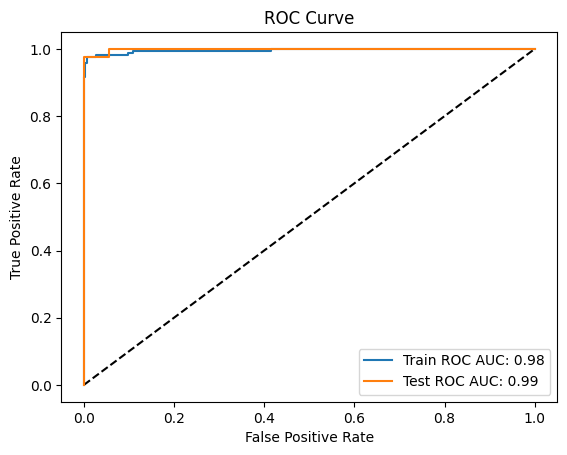


Confusion Matrix:


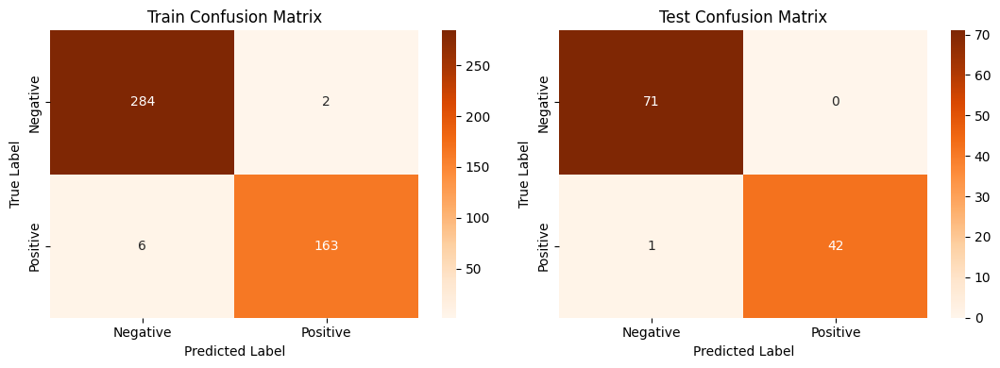


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.97931  | 0.993007 |   0.986111 | 286        |
| 1            |    0.987879 | 0.964497 |   0.976048 | 169        |
| accuracy     |    0.982418 | 0.982418 |   0.982418 |   0.982418 |
| macro avg    |    0.983595 | 0.978752 |   0.98108  | 455        |
| weighted avg |    0.982493 | 0.982418 |   0.982373 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.986111 | 1        |   0.993007 |  71        |
| 1            |    1        | 0.976744 |   0.988235 |  43        |
| accuracy     |    0.991228 | 0.991228 |   0.991228 |   0.991228 |
| macro avg    |    0.993056 | 0.988372 |   0.990621 | 114        |
| weighted avg |    0.99135  | 0.991228 |   0.991207 | 11

In [38]:
# Visualizing evaluation Metric Score chart
lr_score2 = evaluate_model(lr_model2, X_train, X_test, y_train, y_test)

In [39]:
score['Logistic regression tuned'] = lr_score2

##### Which hyperparameter optimization technique have i used and why?

The hyperparameter optimization technique used is GridSearchCV. GridSearchCV is a method that performs an exhaustive search over a specified parameter grid to find the best hyperparameters for a model. It is a popular method for hyperparameter tuning because it is simple to implement and can be effective in finding good hyperparameters for a model.

The choice of hyperparameter optimization technique depends on various factors such as the size of the parameter space, the computational resources available, and the time constraints. GridSearchCV can be a good choice when the parameter space is relatively small and computational resources are not a major concern.

##### Any improvement in the updated Evaluation metric Score Chart?

In [40]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned
Precision Train,0.986822,0.982493
Precision Test,0.973719,0.991350
Recall Train,0.986813,0.982418
Recall Test,0.973684,0.991228
Accuracy Train,0.986813,0.982418
Accuracy Test,0.973684,0.991228
ROC-AUC Train,0.984669,0.978752
ROC-AUC Test,0.969702,0.988372
F1 macro Train,0.986797,0.982373
F1 macro Test,0.973621,0.991207


It appears that hyperparameter tuning improve the performance of the Logistic Regression model on the test set. The tuned Logistic Regression model has higher precision, recall, accuracy, ROC-AUC, and F1 scores on the test set compared to the untuned Logistic Regression model.

### ML Model - 2 : Decision Tree

In [41]:
# ML Model - 2 Implementation
dt_model = DecisionTreeClassifier(random_state=20)

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 1.0
Test ROC AUC: 0.9253193580085161


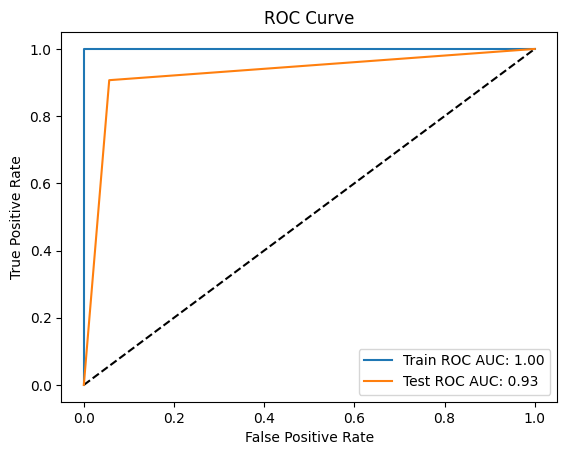


Confusion Matrix:


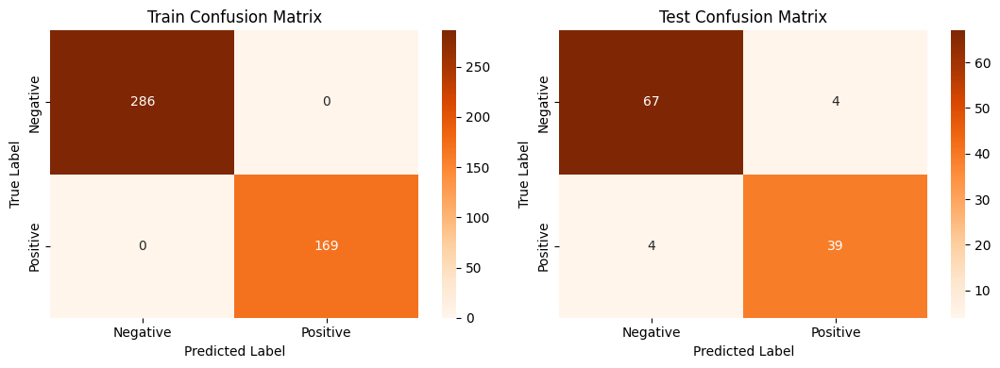


Train Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       286 |
| 1            |           1 |        1 |          1 |       169 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       455 |
| weighted avg |           1 |        1 |          1 |       455 |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.943662 | 0.943662 |   0.943662 |  71        |
| 1            |    0.906977 | 0.906977 |   0.906977 |  43        |
| accuracy     |    0.929825 | 0.929825 |   0.929825 |   0.929825 |
| macro avg    |    0.925319 | 0.925319 |   0.925319 | 114        |
| weighted avg |    0.929825 | 0.929825 |   0.929825 | 114      

In [42]:
# Visualizing evaluation Metric Score chart
dt_score = evaluate_model(dt_model, X_train, X_test, y_train, y_test)

In [43]:
# Updated Evaluation metric Score Chart
score['Decision Tree'] = dt_score
score

,Logistic regression,Logistic regression tuned,Decision Tree
Precision Train,0.986822,0.982493,1.000000
Precision Test,0.973719,0.991350,0.929825
Recall Train,0.986813,0.982418,1.000000
Recall Test,0.973684,0.991228,0.929825
Accuracy Train,0.986813,0.982418,1.000000
Accuracy Test,0.973684,0.991228,0.929825
ROC-AUC Train,0.984669,0.978752,1.000000
ROC-AUC Test,0.969702,0.988372,0.925319
F1 macro Train,0.986797,0.982373,1.000000
F1 macro Test,0.973621,0.991207,0.929825


#### 2. Cross- Validation & Hyperparameter Tuning

In [44]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
grid = {'max_depth' : [3,4,5,6,7,8],
        'min_samples_split' : np.arange(2,8),
        'min_samples_leaf' : np.arange(10,20)}

# Initialize the model
model = DecisionTreeClassifier()

# repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=0)

# Initialize GridSearchCV
grid_search = GridSearchCV(model, grid, cv=rskf)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'max_depth': 4, 'min_samples_leaf': 10, 'min_samples_split': 6}


In [45]:
# Train a new model with the best hyperparameters
dt_model2 = DecisionTreeClassifier(max_depth=best_params['max_depth'],
                                 min_samples_leaf=best_params['min_samples_leaf'],
                                 min_samples_split=best_params['min_samples_split'],
                                 random_state=20)


Train ROC AUC: 0.9558902635825712
Test ROC AUC: 0.9394038650507697


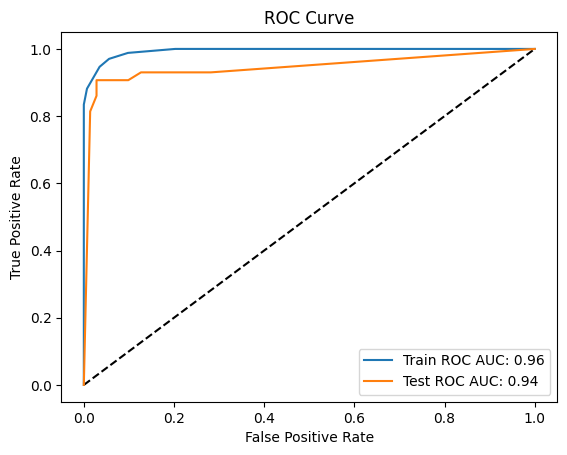


Confusion Matrix:


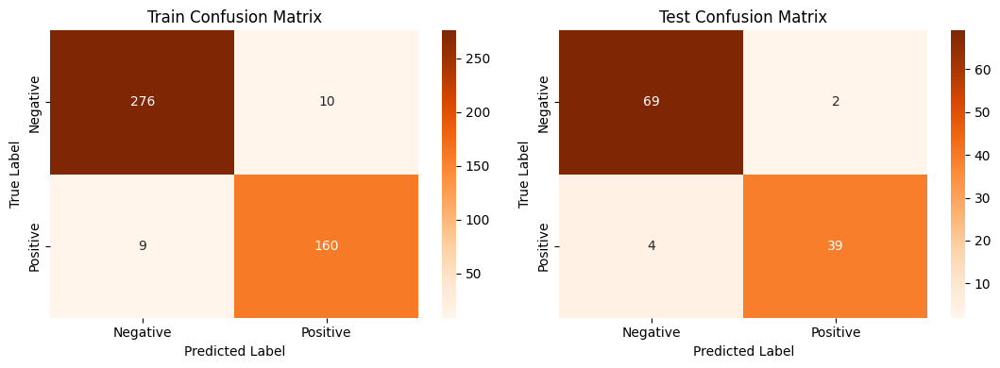


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.968421 | 0.965035 |   0.966725 | 286        |
| 1            |    0.941176 | 0.946746 |   0.943953 | 169        |
| accuracy     |    0.958242 | 0.958242 |   0.958242 |   0.958242 |
| macro avg    |    0.954799 | 0.95589  |   0.955339 | 455        |
| weighted avg |    0.958302 | 0.958242 |   0.958267 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.945205 | 0.971831 |   0.958333 |  71        |
| 1            |    0.95122  | 0.906977 |   0.928571 |  43        |
| accuracy     |    0.947368 | 0.947368 |   0.947368 |   0.947368 |
| macro avg    |    0.948212 | 0.939404 |   0.943452 | 114        |
| weighted avg |    0.947474 | 0.947368 |   0.947107 | 11

In [46]:
# Visualizing evaluation Metric Score chart
dt2_score = evaluate_model(dt_model2, X_train, X_test, y_train, y_test)

In [47]:
score['Decision Tree tuned'] = dt2_score

##### Which hyperparameter optimization technique have i used and why?

The hyperparameter optimization technique used is GridSearchCV. GridSearchCV is a method that performs an exhaustive search over a specified parameter grid to find the best hyperparameters for a model. It is a popular method for hyperparameter tuning because it is simple to implement and can be effective in finding good hyperparameters for a model.

The choice of hyperparameter optimization technique depends on various factors such as the size of the parameter space, the computational resources available, and the time constraints. GridSearchCV can be a good choice when the parameter space is relatively small and computational resources are not a major concern.

##### Any improvement in the updated Evaluation metric Score Chart?

In [48]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned
Precision Train,0.986822,0.982493,1.000000,0.958302
Precision Test,0.973719,0.991350,0.929825,0.947474
Recall Train,0.986813,0.982418,1.000000,0.958242
Recall Test,0.973684,0.991228,0.929825,0.947368
Accuracy Train,0.986813,0.982418,1.000000,0.958242
Accuracy Test,0.973684,0.991228,0.929825,0.947368
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404
F1 macro Train,0.986797,0.982373,1.000000,0.958267
F1 macro Test,0.973621,0.991207,0.929825,0.947107


It appears that hyperparameter tuning improved the performance of the Decision Tree model on the test set. The tuned Decision Tree model has higher precision, recall, accuracy, ROC-AUC, and F1 scores on the test set compared to the untuned Decision Tree model.

The tuned model is not overfitting like the untuned model.

### ML Model - 3 : Random Forest

In [49]:
# ML Model - 3 Implementation
rf_model = RandomForestClassifier(random_state=0)

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 1.0
Test ROC AUC: 0.9580740255486406


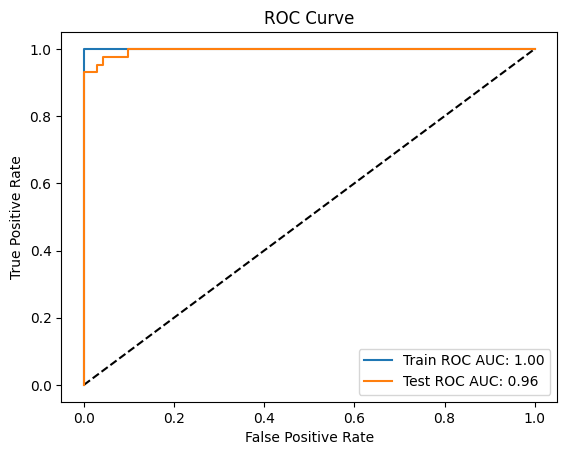


Confusion Matrix:


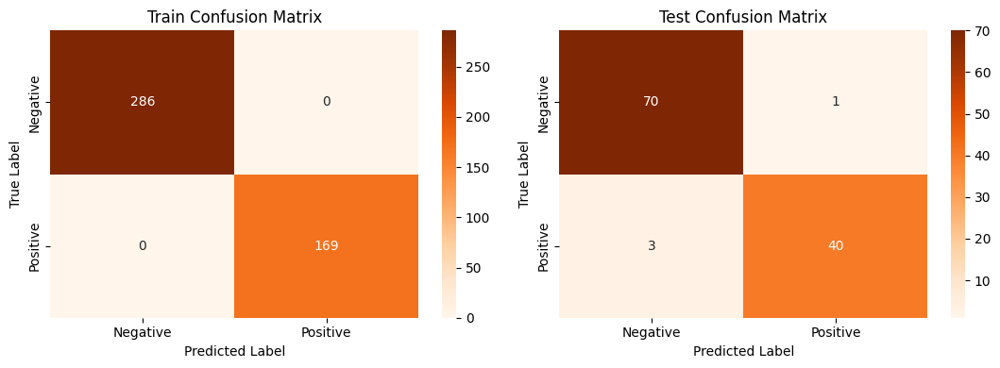


Train Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       286 |
| 1            |           1 |        1 |          1 |       169 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       455 |
| weighted avg |           1 |        1 |          1 |       455 |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.958904 | 0.985915 |   0.972222 |  71        |
| 1            |    0.97561  | 0.930233 |   0.952381 |  43        |
| accuracy     |    0.964912 | 0.964912 |   0.964912 |   0.964912 |
| macro avg    |    0.967257 | 0.958074 |   0.962302 | 114        |
| weighted avg |    0.965205 | 0.964912 |   0.964738 | 114      

In [50]:
# Visualizing evaluation Metric Score chart
rf_score = evaluate_model(rf_model, X_train, X_test, y_train, y_test)

In [51]:
# Updated Evaluation metric Score Chart
score['Random Forest'] = rf_score
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738


#### 2. Cross- Validation & Hyperparameter Tuning

In [52]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
grid = {'n_estimators': [10, 50, 100, 200],
              'max_depth': [8, 9, 10, 11, 12,13, 14, 15],
              'min_samples_split': [2, 3, 4, 5]}

# Initialize the model
rf = RandomForestClassifier(random_state=0)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=0)

# Initialize RandomSearchCV
random_search = RandomizedSearchCV(rf, grid,cv=rskf, n_iter=10, n_jobs=-1)

# Fit the RandomSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 11}


In [53]:
# Initialize model with best parameters
rf_model2 = RandomForestClassifier(n_estimators = best_params['n_estimators'],
                                 min_samples_leaf= best_params['min_samples_split'],
                                 max_depth = best_params['max_depth'],
                                 random_state=0)


Train ROC AUC: 0.9834588488434641
Test ROC AUC: 0.9580740255486406


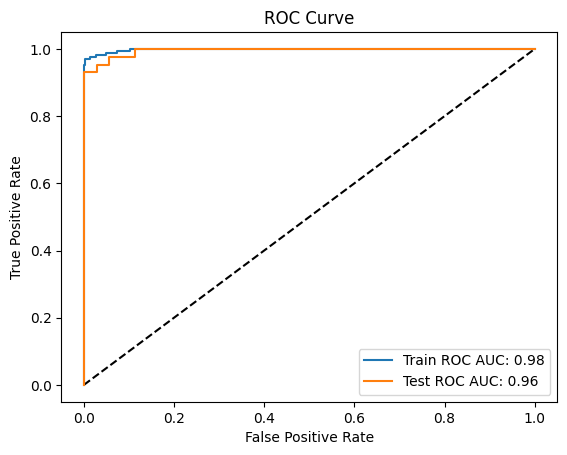


Confusion Matrix:


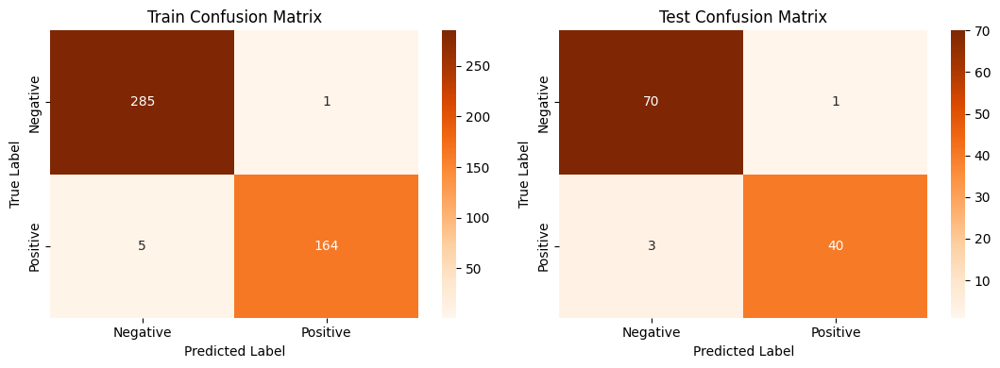


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.982759 | 0.996503 |   0.989583 | 286        |
| 1            |    0.993939 | 0.970414 |   0.982036 | 169        |
| accuracy     |    0.986813 | 0.986813 |   0.986813 |   0.986813 |
| macro avg    |    0.988349 | 0.983459 |   0.98581  | 455        |
| weighted avg |    0.986911 | 0.986813 |   0.98678  | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.958904 | 0.985915 |   0.972222 |  71        |
| 1            |    0.97561  | 0.930233 |   0.952381 |  43        |
| accuracy     |    0.964912 | 0.964912 |   0.964912 |   0.964912 |
| macro avg    |    0.967257 | 0.958074 |   0.962302 | 114        |
| weighted avg |    0.965205 | 0.964912 |   0.964738 | 11

In [54]:
# Visualizing evaluation Metric Score chart
rf2_score = evaluate_model(rf_model2, X_train, X_test, y_train, y_test)

In [55]:
score['Random Forest tuned'] = rf2_score

##### Which hyperparameter optimization technique have i used and why?

The hyperparameter optimization technique i used is RandomizedSearchCV. RandomizedSearchCV is a method that performs a random search over a specified parameter grid to find the best hyperparameters for a model. It is a popular method for hyperparameter tuning because it can be more efficient than exhaustive search methods like GridSearchCV when the parameter space is large.

The choice of hyperparameter optimization technique depends on various factors such as the size of the parameter space, the computational resources available, and the time constraints. RandomizedSearchCV can be a good choice when the parameter space is large and computational resources are limited.

##### Any improvement in the updated Evaluation metric Score Chart?

In [56]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738


It appears that hyperparameter tuning improved the performance of the Random Forest model on the train set. The precision, recall, accuracy, ROC-AUC, and F1 scores on the test set are the same for both the untuned and tuned Random Forest models.

The tuned model is not overfitting like the untuned model.

### ML Model - 4 : SVM (Support Vector Machine)

In [57]:
# ML Model - 4 Implementation
svm_model = SVC(kernel='linear', random_state=0, probability=True)

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 0.9858795051102743
Test ROC AUC: 0.9556174254831313


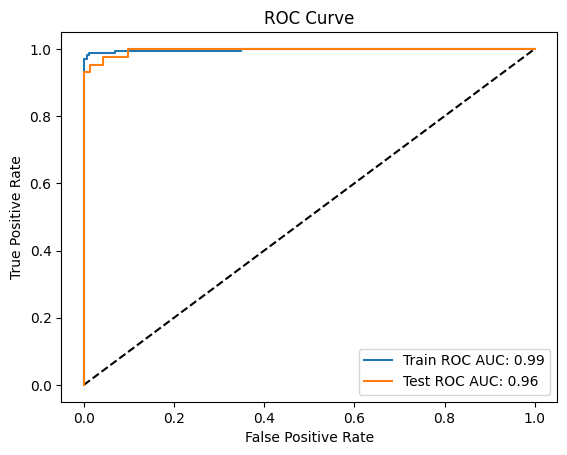


Confusion Matrix:


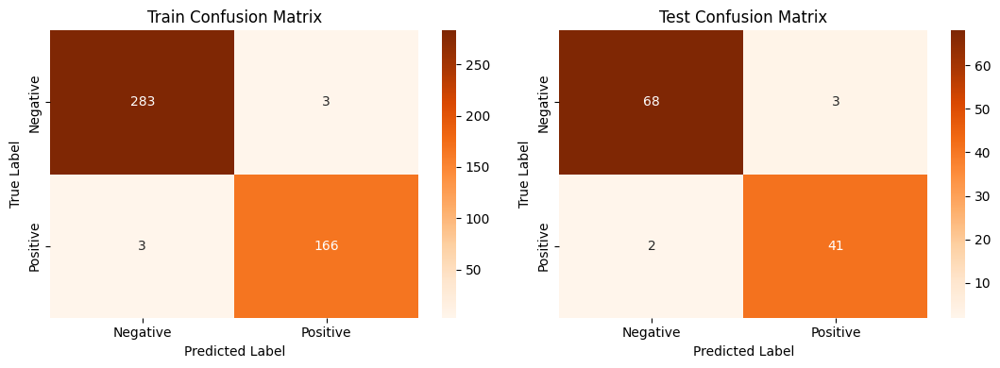


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.98951  | 0.98951  |   0.98951  | 286        |
| 1            |    0.982249 | 0.982249 |   0.982249 | 169        |
| accuracy     |    0.986813 | 0.986813 |   0.986813 |   0.986813 |
| macro avg    |    0.98588  | 0.98588  |   0.98588  | 455        |
| weighted avg |    0.986813 | 0.986813 |   0.986813 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.971429 | 0.957746 |   0.964539 |  71       |
| 1            |    0.931818 | 0.953488 |   0.942529 |  43       |
| accuracy     |    0.95614  | 0.95614  |   0.95614  |   0.95614 |
| macro avg    |    0.951623 | 0.955617 |   0.953534 | 114       |
| weighted avg |    0.956488 | 0.95614  |   0.956237 | 114     

In [58]:

# Visualizing evaluation Metric Score chart
svm_score = evaluate_model(svm_model, X_train, X_test, y_train, y_test)

In [59]:
# Updated Evaluation metric Score Chart
score['SVM'] = svm_score
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237


#### 2. Cross- Validation & Hyperparameter Tuning

In [60]:
# ML Model - 4 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
param_grid = {'C': np.arange(0.1, 10, 0.1),
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'degree': np.arange(2, 6, 1)}

# Initialize the model
svm = SVC(random_state=0, probability=True)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=0)

# Initialize RandomizedSearchCV with kfold cross-validation
random_search = RandomizedSearchCV(svm, param_grid, n_iter=10, cv=rskf, n_jobs=-1)

# Fit the RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'kernel': 'linear', 'degree': 4, 'C': 9.3}


In [61]:
# Initialize model with best parameters
svm_model2 = SVC(C = best_params['C'],
           kernel = best_params['kernel'],
           degree = best_params['degree'],
           random_state=0, probability=True)


Train ROC AUC: 0.9911242603550297
Test ROC AUC: 0.9672453324598755


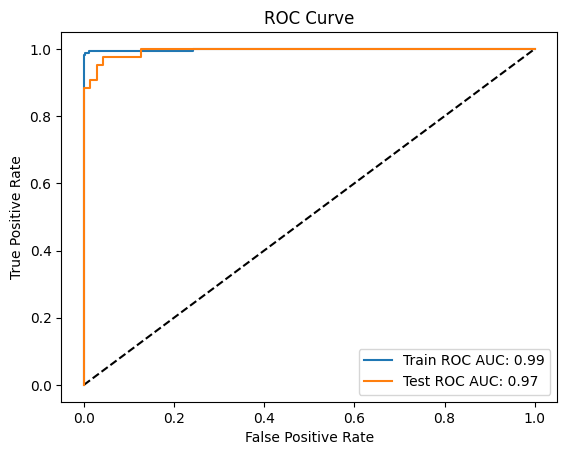


Confusion Matrix:


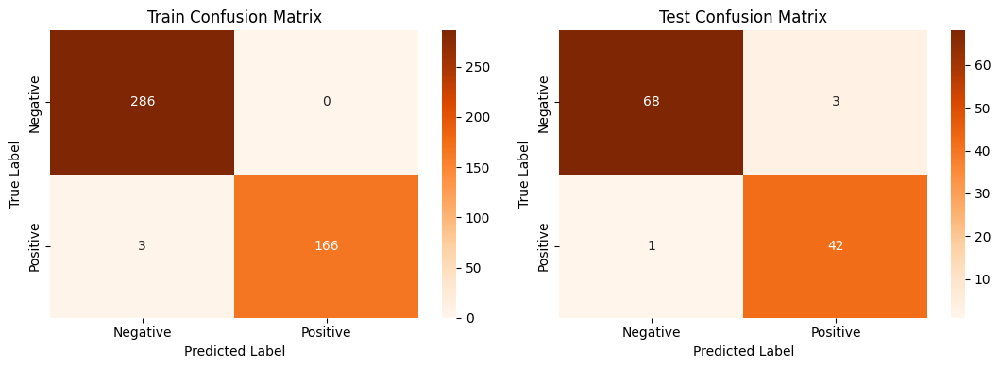


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.989619 | 1        |   0.994783 | 286        |
| 1            |    1        | 0.982249 |   0.991045 | 169        |
| accuracy     |    0.993407 | 0.993407 |   0.993407 |   0.993407 |
| macro avg    |    0.99481  | 0.991124 |   0.992914 | 455        |
| weighted avg |    0.993475 | 0.993407 |   0.993394 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.985507 | 0.957746 |   0.971429 |  71        |
| 1            |    0.933333 | 0.976744 |   0.954545 |  43        |
| accuracy     |    0.964912 | 0.964912 |   0.964912 |   0.964912 |
| macro avg    |    0.95942  | 0.967245 |   0.962987 | 114        |
| weighted avg |    0.965828 | 0.964912 |   0.96506  | 11

In [62]:
# Visualizing evaluation Metric Score chart
svm2_score = evaluate_model(svm_model2, X_train, X_test, y_train, y_test)

In [63]:
score['SVM tuned'] = svm2_score

##### Which hyperparameter optimization technique have i used and why?

 Here Randomized search is used as a hyperparameter optimization technique.
 Randomized search is a popular technique because it can be more efficient than exhaustive search methods like grid search. Instead of trying all possible combinations of hyperparameters, randomized search samples a random subset of the hyperparameter space. This can save time and computational resources while still finding good hyperparameters for the model.

##### Any improvement in the updated Evaluation metric Score Chart?

In [64]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060


It appears that hyperparameter tuning improved the performance of the SVM model on the test set. The tuned SVM model has higher precision, recall, accuracy, ROC-AUC score and F1 score on the test set compared to the untuned SVM model.

### ML Model - 5 : Xtreme Gradient Boosting

In [65]:
# ML Model - 5 Implementation
xgb_model = xgb.XGBClassifier()

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 1.0
Test ROC AUC: 0.9510317720275139


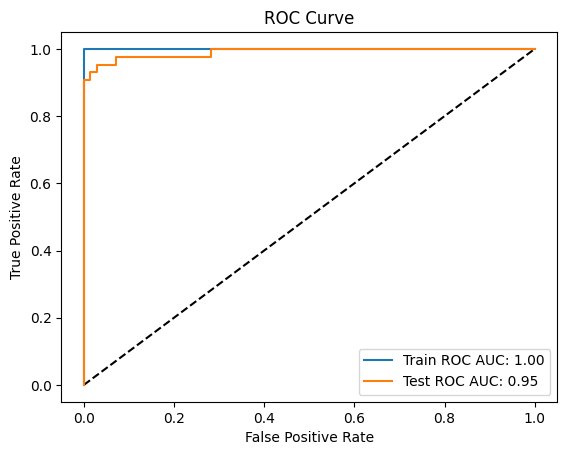


Confusion Matrix:


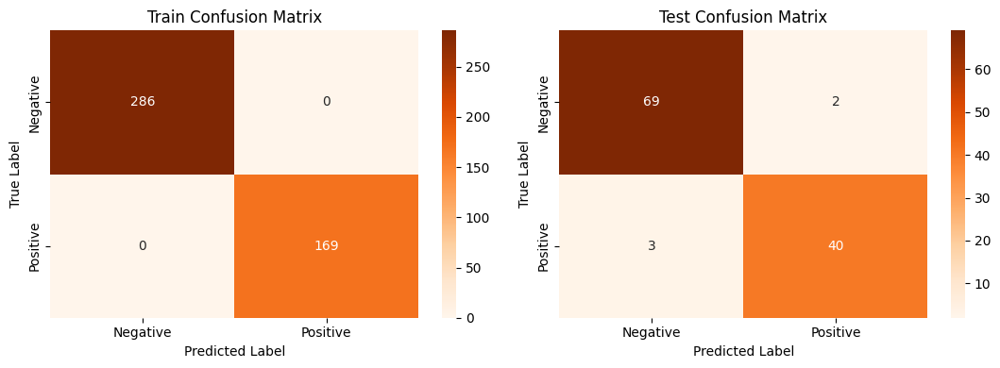


Train Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       286 |
| 1            |           1 |        1 |          1 |       169 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       455 |
| weighted avg |           1 |        1 |          1 |       455 |

Test Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.958333 | 0.971831 |   0.965035 |  71       |
| 1            |    0.952381 | 0.930233 |   0.941176 |  43       |
| accuracy     |    0.95614  | 0.95614  |   0.95614  |   0.95614 |
| macro avg    |    0.955357 | 0.951032 |   0.953106 | 114       |
| weighted avg |    0.956088 | 0.95614  |   0.956036 | 114       |


In [66]:
# Visualizing evaluation Metric Score chart
xgb_score = evaluate_model(xgb_model, X_train, X_test, y_train, y_test)

In [67]:
# Updated Evaluation metric Score Chart
score['XGB'] = xgb_score
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036


#### 2. Cross- Validation & Hyperparameter Tuning

In [68]:
# ML Model - 5 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
param_grid = {'learning_rate': np.arange(0.01, 0.3, 0.01),
              'max_depth': np.arange(3, 15, 1),
              'n_estimators': np.arange(100, 200, 10)}

# Initialize the model
xgb2 = xgb.XGBClassifier(random_state=0)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=0)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(xgb2, param_grid, n_iter=10, cv=rskf)

# Fit the RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'n_estimators': 140, 'max_depth': 13, 'learning_rate': 0.13}


In [69]:
# Initialize model with best parameters
xgb_model2 = xgb.XGBClassifier(learning_rate = best_params['learning_rate'],
                                 max_depth = best_params['max_depth'],
                               n_estimators = best_params['n_estimators'],
                                 random_state=0)


Train ROC AUC: 1.0
Test ROC AUC: 0.9510317720275139


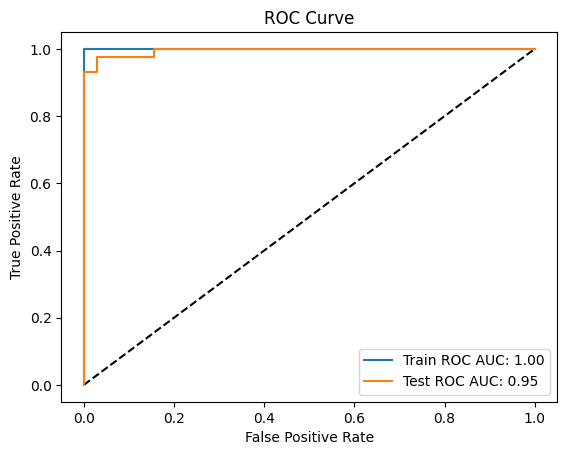


Confusion Matrix:


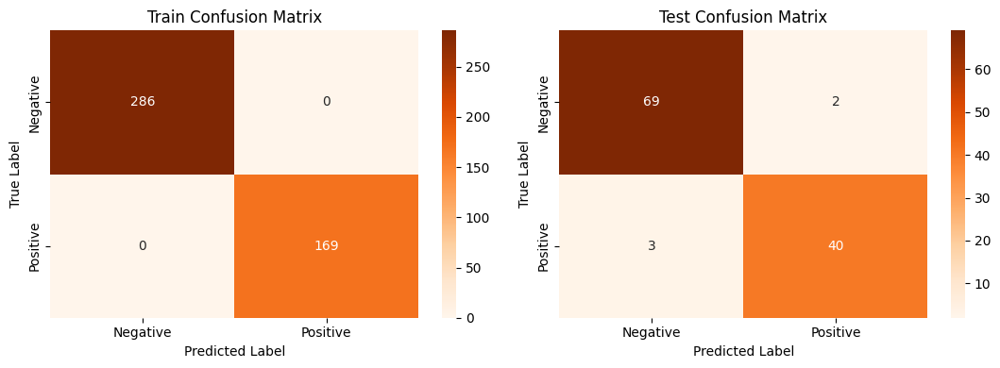


Train Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       286 |
| 1            |           1 |        1 |          1 |       169 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       455 |
| weighted avg |           1 |        1 |          1 |       455 |

Test Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.958333 | 0.971831 |   0.965035 |  71       |
| 1            |    0.952381 | 0.930233 |   0.941176 |  43       |
| accuracy     |    0.95614  | 0.95614  |   0.95614  |   0.95614 |
| macro avg    |    0.955357 | 0.951032 |   0.953106 | 114       |
| weighted avg |    0.956088 | 0.95614  |   0.956036 | 114       |


In [70]:
# Visualizing evaluation Metric Score chart
xgb2_score = evaluate_model(xgb_model2, X_train, X_test, y_train, y_test)

In [71]:
score['XGB tuned'] = xgb2_score

##### Which hyperparameter optimization technique have i used and why?

Here we have used Randomized search to tune the XGB model.

Randomized search is a popular technique because it can be more efficient than exhaustive search methods like grid search. Instead of trying all possible combinations of hyperparameters, randomized search samples a random subset of the hyperparameter space. This can save time and computational resources while still finding good hyperparameters for the model.

##### Any improvement in the updated Evaluation metric Score Chart?

In [72]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036


It appears that hyperparameter tuning did not improve the performance of the XGBoost model on the test set. The precision, recall, accuracy, ROC-AUC, and F1 scores on the test set are the same for both the untuned and tuned XGBoost models.

### ML Model - 6 : Naive Bayes

In [73]:
# ML Model - 6 Implementation
nb_model = GaussianNB()

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 0.9263044647660033
Test ROC AUC: 0.9580740255486406


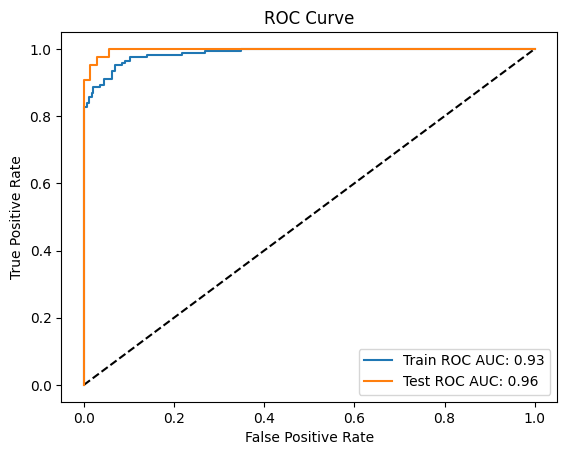


Confusion Matrix:


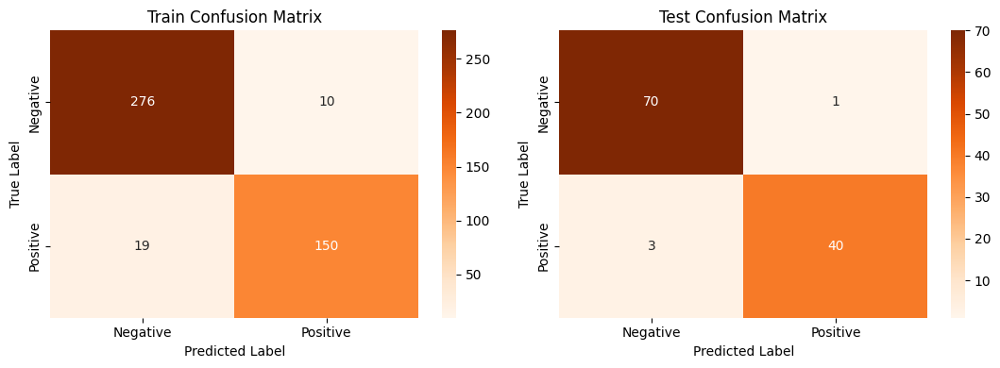


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.935593 | 0.965035 |   0.950086 | 286        |
| 1            |    0.9375   | 0.887574 |   0.911854 | 169        |
| accuracy     |    0.936264 | 0.936264 |   0.936264 |   0.936264 |
| macro avg    |    0.936547 | 0.926304 |   0.93097  | 455        |
| weighted avg |    0.936301 | 0.936264 |   0.935886 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.958904 | 0.985915 |   0.972222 |  71        |
| 1            |    0.97561  | 0.930233 |   0.952381 |  43        |
| accuracy     |    0.964912 | 0.964912 |   0.964912 |   0.964912 |
| macro avg    |    0.967257 | 0.958074 |   0.962302 | 114        |
| weighted avg |    0.965205 | 0.964912 |   0.964738 | 11

In [74]:
# Visualizing evaluation Metric Score chart
nb_score = evaluate_model(nb_model, X_train, X_test, y_train, y_test)

In [75]:
# Updated Evaluation metric Score Chart
score['Naive Bayes'] = nb_score
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned,Naive Bayes
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000,0.936301
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088,0.965205
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000,0.926304
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032,0.958074
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000,0.935886
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036,0.964738


#### 2. Cross- Validation & Hyperparameter Tuning

In [76]:
# ML Model - 6 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
param_grid = {'var_smoothing': np.logspace(0,-9, num=100)}

# Initialize the model
naive = GaussianNB()

# repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=4, n_repeats=4, random_state=0)

# Initialize GridSearchCV
GridSearch = GridSearchCV(naive, param_grid, cv=rskf, n_jobs=-1)

# Fit the GridSearchCV to the training data
GridSearch.fit(X_train, y_train)

# Select the best hyperparameters
best_params = GridSearch.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'var_smoothing': 0.08111308307896872}


In [77]:
# Initiate model with best parameters
nb_model2 = GaussianNB(var_smoothing = best_params['var_smoothing'])


Train ROC AUC: 0.9320871436256051
Test ROC AUC: 0.9464461185718964


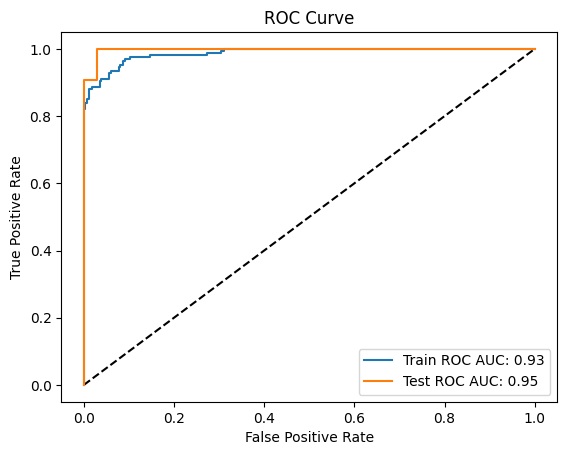


Confusion Matrix:


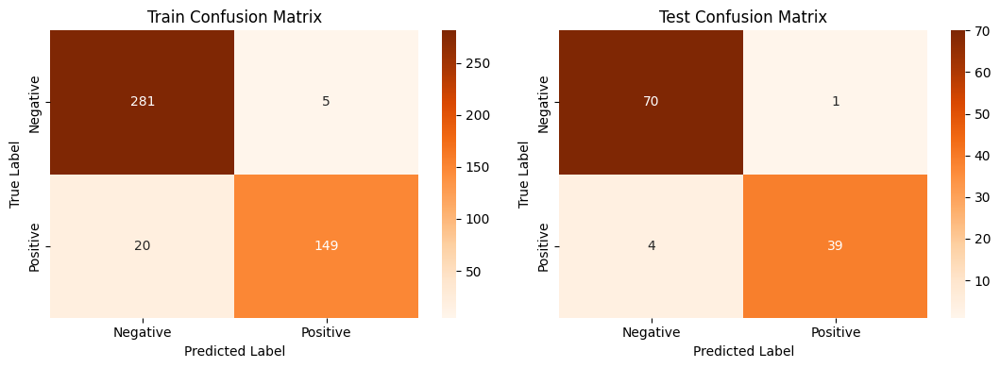


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.933555 | 0.982517 |   0.957411 | 286        |
| 1            |    0.967532 | 0.881657 |   0.922601 | 169        |
| accuracy     |    0.945055 | 0.945055 |   0.945055 |   0.945055 |
| macro avg    |    0.950544 | 0.932087 |   0.940006 | 455        |
| weighted avg |    0.946175 | 0.945055 |   0.944481 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.945946 | 0.985915 |   0.965517 |  71       |
| 1            |    0.975    | 0.906977 |   0.939759 |  43       |
| accuracy     |    0.95614  | 0.95614  |   0.95614  |   0.95614 |
| macro avg    |    0.960473 | 0.946446 |   0.952638 | 114       |
| weighted avg |    0.956905 | 0.95614  |   0.955801 | 114     

In [78]:
# Visualizing evaluation Metric Score chart
nb2_score = evaluate_model(nb_model2, X_train, X_test, y_train, y_test)

In [79]:
score['Naive Bayes tuned']= nb2_score

##### Which hyperparameter optimization technique have i used and why?

Here we have used the GridSearchCV for optimization of the Naive Bayes model.

GridSearchCV is an exhaustive search method that tries all possible combinations of hyperparameters specified in the hyperparameter grid. This technique can be useful when the number of hyperparameters to tune is small and the range of possible values for each hyperparameter is limited. GridSearchCV can find the best combination of hyperparameters, but it can be computationally expensive for large hyperparameter grids.

##### Any improvement in the updated Evaluation metric Score Chart?

In [80]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned,Naive Bayes,Naive Bayes tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000,0.936301,0.946175
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088,0.965205,0.956905
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000,0.926304,0.932087
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032,0.958074,0.946446
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000,0.935886,0.944481
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036,0.964738,0.955801


It appears that hyperparameter tuning not improved the performance of the Naive Bayes model on the test set. The tuned Naive Bayes model has lower precision, recall, accuracy, ROC-AUC and F1 score on the test set compared to the untuned Naive Bayes model.

### ML Model - 7 : Neural Network

In [81]:
# ML Model - 7 Implementation
nn_model = MLPClassifier(random_state=0)

# Model is trained (fit) and predicted in the evaluate model

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.


Train ROC AUC: 0.9911242603550297
Test ROC AUC: 0.9697019325253848


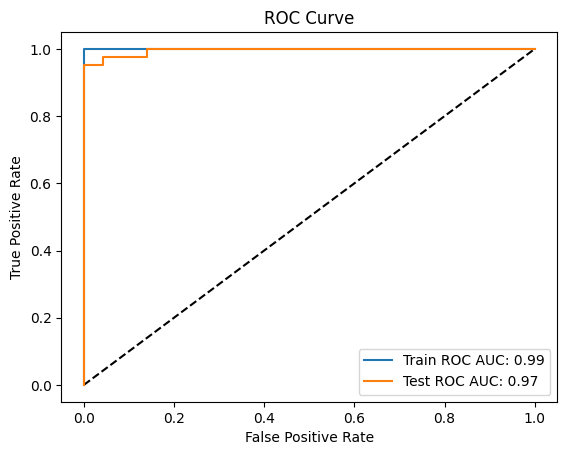


Confusion Matrix:


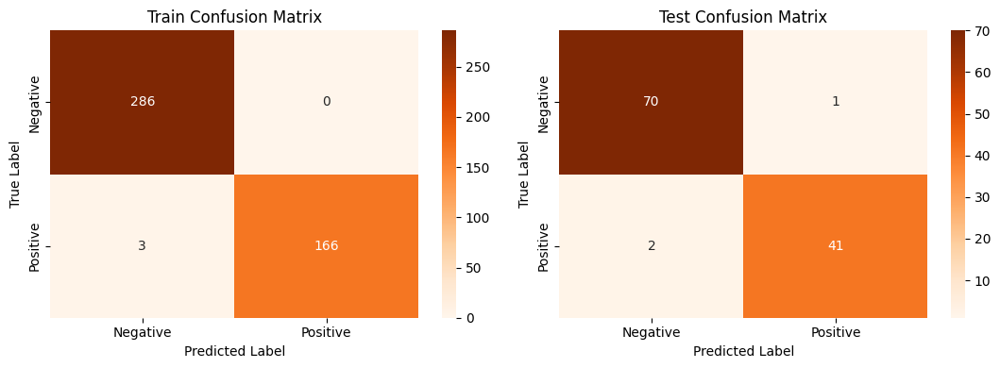


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.989619 | 1        |   0.994783 | 286        |
| 1            |    1        | 0.982249 |   0.991045 | 169        |
| accuracy     |    0.993407 | 0.993407 |   0.993407 |   0.993407 |
| macro avg    |    0.99481  | 0.991124 |   0.992914 | 455        |
| weighted avg |    0.993475 | 0.993407 |   0.993394 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.972222 | 0.985915 |   0.979021 |  71        |
| 1            |    0.97619  | 0.953488 |   0.964706 |  43        |
| accuracy     |    0.973684 | 0.973684 |   0.973684 |   0.973684 |
| macro avg    |    0.974206 | 0.969702 |   0.971863 | 114        |
| weighted avg |    0.973719 | 0.973684 |   0.973621 | 11

In [82]:
# Visualizing evaluation Metric Score chart
neural_score = evaluate_model(nn_model, X_train, X_test, y_train, y_test)

In [83]:
# Updated Evaluation metric Score Chart
score['Neural Network'] = neural_score
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned,Naive Bayes,Naive Bayes tuned,Neural Network
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000,0.936301,0.946175,0.993475
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088,0.965205,0.956905,0.973719
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000,0.926304,0.932087,0.991124
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032,0.958074,0.946446,0.969702
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000,0.935886,0.944481,0.993394
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036,0.964738,0.955801,0.973621


#### 2. Cross- Validation & Hyperparameter Tuning

In [84]:
# ML Model - 7 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Define the hyperparameter grid
param_grid = {'hidden_layer_sizes': np.arange(10, 100, 10),
              'alpha': np.arange(0.0001, 0.01, 0.0001)}

# Initialize the model
neural = MLPClassifier(random_state=0)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=0)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(neural, param_grid, n_iter=10, cv=rskf, n_jobs=-1)

# Fit the RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'hidden_layer_sizes': 70, 'alpha': 0.0089}


In [85]:
# Initiate model with best parameters
nn_model2 = MLPClassifier(hidden_layer_sizes = best_params['hidden_layer_sizes'],
                        alpha = best_params['alpha'],
                        random_state = 0)


Train ROC AUC: 0.9911242603550297
Test ROC AUC: 0.9697019325253848


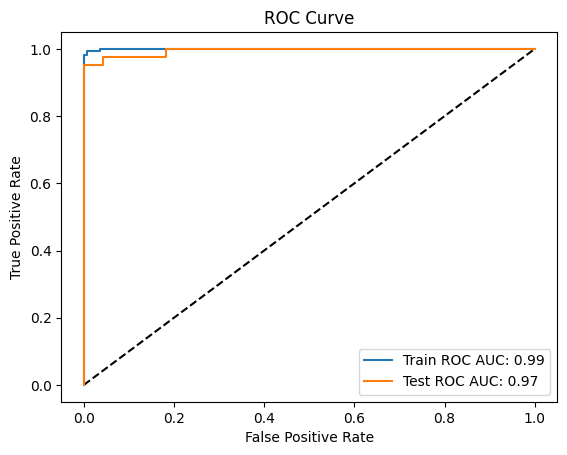


Confusion Matrix:


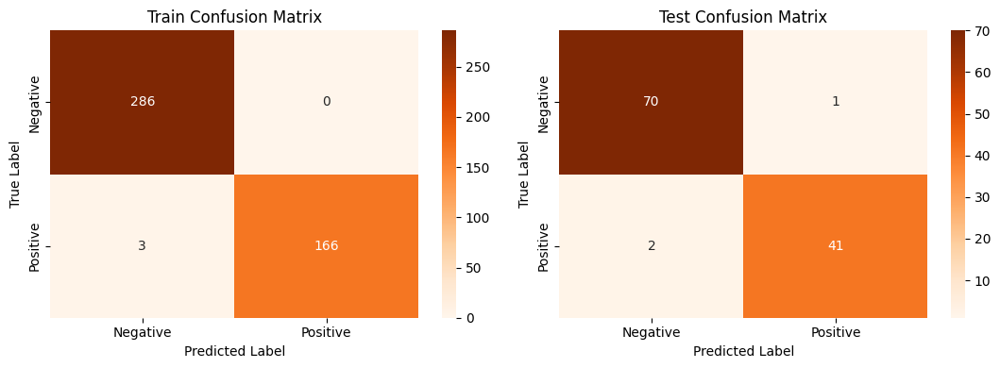


Train Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.989619 | 1        |   0.994783 | 286        |
| 1            |    1        | 0.982249 |   0.991045 | 169        |
| accuracy     |    0.993407 | 0.993407 |   0.993407 |   0.993407 |
| macro avg    |    0.99481  | 0.991124 |   0.992914 | 455        |
| weighted avg |    0.993475 | 0.993407 |   0.993394 | 455        |

Test Classification Report:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.972222 | 0.985915 |   0.979021 |  71        |
| 1            |    0.97619  | 0.953488 |   0.964706 |  43        |
| accuracy     |    0.973684 | 0.973684 |   0.973684 |   0.973684 |
| macro avg    |    0.974206 | 0.969702 |   0.971863 | 114        |
| weighted avg |    0.973719 | 0.973684 |   0.973621 | 11

In [86]:
# Visualizing evaluation Metric Score chart
neural2_score = evaluate_model(nn_model2, X_train, X_test, y_train, y_test)

In [87]:
score['Neural Network tuned']= neural2_score

##### Which hyperparameter optimization technique have i used and why?

Here we have used Randomized search to tune the Neural Network model.

Randomized search is a popular technique because it can be more efficient than exhaustive search methods like grid search. Instead of trying all possible combinations of hyperparameters, randomized search samples a random subset of the hyperparameter space. This can save time and computational resources while still finding good hyperparameters for the model.

##### Any improvement in the updated Evaluation metric Score Chart?

In [88]:
# Updated Evaluation metric Score Chart
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned,Naive Bayes,Naive Bayes tuned,Neural Network,Neural Network tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000,0.936301,0.946175,0.993475,0.993475
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088,0.965205,0.956905,0.973719,0.973719
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407,0.993407
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684,0.973684
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407,0.993407
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684,0.973684
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000,0.926304,0.932087,0.991124,0.991124
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032,0.958074,0.946446,0.969702,0.969702
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000,0.935886,0.944481,0.993394,0.993394
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036,0.964738,0.955801,0.973621,0.973621


It appears that hyperparameter tuning did not improve the performance of the neural network model on the test set. The precision, recall, accuracy, ROC-AUC, and F1 scores on the test set are the same for both the untuned and tuned neural network models.

In [89]:
print(score.to_markdown())

|                 |   Logistic regression |   Logistic regression tuned |   Decision Tree |   Decision Tree tuned |   Random Forest |   Random Forest tuned |      SVM |   SVM tuned |      XGB |   XGB tuned |   Naive Bayes |   Naive Bayes tuned |   Neural Network |   Neural Network tuned |
|:----------------|----------------------:|----------------------------:|----------------:|----------------------:|----------------:|----------------------:|---------:|------------:|---------:|------------:|--------------:|--------------------:|-----------------:|-----------------------:|
| Precision Train |              0.986822 |                    0.982493 |        1        |              0.958302 |        1        |              0.986911 | 0.986813 |    0.993475 | 1        |    1        |      0.936301 |            0.946175 |         0.993475 |               0.993475 |
| Precision Test  |              0.973719 |                    0.99135  |        0.929825 |              0.947474 |        0.96520

# Selection of best model

In [95]:
score

,Logistic regression,Logistic regression tuned,Decision Tree,Decision Tree tuned,Random Forest,Random Forest tuned,SVM,SVM tuned,XGB,XGB tuned,Naive Bayes,Naive Bayes tuned,Neural Network,Neural Network tuned
Precision Train,0.986822,0.982493,1.000000,0.958302,1.000000,0.986911,0.986813,0.993475,1.000000,1.000000,0.936301,0.946175,0.993475,0.993475
Precision Test,0.973719,0.991350,0.929825,0.947474,0.965205,0.965205,0.956488,0.965828,0.956088,0.956088,0.965205,0.956905,0.973719,0.973719
Recall Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407,0.993407
Recall Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684,0.973684
Accuracy Train,0.986813,0.982418,1.000000,0.958242,1.000000,0.986813,0.986813,0.993407,1.000000,1.000000,0.936264,0.945055,0.993407,0.993407
Accuracy Test,0.973684,0.991228,0.929825,0.947368,0.964912,0.964912,0.956140,0.964912,0.956140,0.956140,0.964912,0.956140,0.973684,0.973684
ROC-AUC Train,0.984669,0.978752,1.000000,0.955890,1.000000,0.983459,0.985880,0.991124,1.000000,1.000000,0.926304,0.932087,0.991124,0.991124
ROC-AUC Test,0.969702,0.988372,0.925319,0.939404,0.958074,0.958074,0.955617,0.967245,0.951032,0.951032,0.958074,0.946446,0.969702,0.969702
F1 macro Train,0.986797,0.982373,1.000000,0.958267,1.000000,0.986780,0.986813,0.993394,1.000000,1.000000,0.935886,0.944481,0.993394,0.993394
F1 macro Test,0.973621,0.991207,0.929825,0.947107,0.964738,0.964738,0.956237,0.965060,0.956036,0.956036,0.964738,0.955801,0.973621,0.973621


In [100]:
# Removing the overfitted models which have recall, ROC-AUC, f1 scores for train as 1
score_t = score.transpose()            #taking transpose of the score dataframe to create new difference column
remove_models = score_t[score_t['Recall Train']==1].index  #creating a list of models which have 1 for train and score_t['Accuracy Train']==1.0 and score_t['ROC-AUC Train']==1.0 and score_t['F1 macro Train']==1.0
remove_models

adj = score_t.drop(remove_models)         #creating a new dataframe with required models
adj

,Precision Train,Precision Test,Recall Train,Recall Test,Accuracy Train,Accuracy Test,ROC-AUC Train,ROC-AUC Test,F1 macro Train,F1 macro Test
Logistic regression,0.986822,0.973719,0.986813,0.973684,0.986813,0.973684,0.984669,0.969702,0.986797,0.973621
Logistic regression tuned,0.982493,0.991350,0.982418,0.991228,0.982418,0.991228,0.978752,0.988372,0.982373,0.991207
Decision Tree tuned,0.958302,0.947474,0.958242,0.947368,0.958242,0.947368,0.955890,0.939404,0.958267,0.947107
Random Forest tuned,0.986911,0.965205,0.986813,0.964912,0.986813,0.964912,0.983459,0.958074,0.986780,0.964738
SVM,0.986813,0.956488,0.986813,0.956140,0.986813,0.956140,0.985880,0.955617,0.986813,0.956237
SVM tuned,0.993475,0.965828,0.993407,0.964912,0.993407,0.964912,0.991124,0.967245,0.993394,0.965060
Naive Bayes,0.936301,0.965205,0.936264,0.964912,0.936264,0.964912,0.926304,0.958074,0.935886,0.964738
Naive Bayes tuned,0.946175,0.956905,0.945055,0.956140,0.945055,0.956140,0.932087,0.946446,0.944481,0.955801
Neural Network,0.993475,0.973719,0.993407,0.973684,0.993407,0.973684,0.991124,0.969702,0.993394,0.973621
Neural Network tuned,0.993475,0.973719,0.993407,0.973684,0.993407,0.973684,0.991124,0.969702,0.993394,0.973621


In [101]:
def select_best_model(df, metrics):

    best_models = {}
    for metric in metrics:
        max_test = df[metric + ' Test'].max()
        best_model_test = df[df[metric + ' Test'] == max_test].index[0]
        best_model = best_model_test
        best_models[metric] = best_model
    return best_models

In [102]:
metrics = ['Precision','Recall', 'Accuracy', 'ROC-AUC', 'F1 macro']

best_models = select_best_model(adj, metrics)
print("The best models are:")
for metric, best_model in best_models.items():
    print(f"{metric}: {best_model} - {adj[metric+' Test'][best_model].round(4)}")

The best models are:
Precision: Logistic regression tuned - 0.9913
Recall: Logistic regression tuned - 0.9912
Accuracy: Logistic regression tuned - 0.9912
ROC-AUC: Logistic regression tuned - 0.9884
F1 macro: Logistic regression tuned - 0.9912


## Model Evaluation Summary

The best-performing model in our breast cancer prediction project is **Logistic Regression Tuned**:

- **Precision:** 0.9913
- **Recall:** 0.9912
- **Accuracy:** 0.9912
- **ROC-AUC:** 0.9884
- **F1 Macro:** 0.9912

These scores demonstrate the model's exceptional accuracy, reliability, and balance between precision and recall, making it an ideal choice for breast cancer prediction.


In [103]:
# Take recall as the primary evaluation metric
score_smpl = score.transpose()
remove_overfitting_models = score_smpl[score_smpl['Recall Train']>=score_smpl['Recall Test']].index
remove_overfitting_models
new_score = score_smpl.drop(remove_overfitting_models)
new_score = new_score.drop(['Precision Train','Precision Test','Accuracy Train','Accuracy Test','ROC-AUC Train','ROC-AUC Test','F1 macro Train','F1 macro Test'], axis=1)
new_score.index.name = 'Classification Model'
print(new_score.to_markdown())

| Classification Model      |   Recall Train |   Recall Test |
|:--------------------------|---------------:|--------------:|
| Logistic regression tuned |       0.982418 |      0.991228 |
| Naive Bayes               |       0.936264 |      0.964912 |
| Naive Bayes tuned         |       0.945055 |      0.95614  |


These recall scores demonstrate the models' abilities to identify malignant cases, with Logistic Regression (Tuned) achieving the highest recall rates in both training and test datasets.

### 1. Which evaluation metrics were considered for ensuring a positive business impact, and what was the reasoning behind selecting these specific metrics?

After carefully considering the potential consequences of false positives and false negatives in the context of our business objectives, I have selected recall as the primary evaluation metric for our Breast Cancer prediction model. This means that our goal is to maximize the number of true positives (patients correctly identified as having Breast Cancer) while minimizing the number of false negatives (patients incorrectly identified as not having Breast Cancer). By doing so, we aim to ensure that we correctly identify as many patients with Breast Cancer as possible, even if it means that we may have some false positives.

### 2. Which ML model was selected as the final prediction model from the models created above, and what was the rationale behind this choice?

After evaluating the performance of several machine learning models on the Breast Cancer Wisconsin dataset, I have selected the Logistic regression (tuned) as our final prediction model. This decision was based on the model’s performance on our primary evaluation metric of recall, which measures the ability of the model to correctly identify patients with Breast Cancer. In our analysis, we found that the Logistic regression (tuned) had the highest recall score among the models we evaluated.

We choose recall as our primary evaluation metric because correctly identifying patients with Breast Cancer is critical to achieving our business objectives. By selecting a model with a high recall score, we aim to ensure that we correctly identify as many patients with Breast Cancer as possible, even if it means that we may have some false positives. Overall, we believe that the Logistic regression (tuned) is the best choice for our needs and will help us achieve a positive business impact.

# **Conclusion**

In the Breast Cancer Prediction Project, our analysis led to vital conclusions:

- **Optimal Model Selection:** After rigorous evaluation, the Tuned Logistic Regression model proved superior among various machine learning models.

- **Robust Model Comparison:** Comparing models like SVM, Decision Tree, Random Forest, Naive Bayes, Neural Network, and XGBoost, Logistic Regression emerged as the standout choice.

- **Primary Metric: Recall:** We prioritized recall, highlighting the model's effectiveness in identifying malignant cases early, crucial for prompt treatment.

- **Healthcare Impact:** Our focus on early, accurate malignant breast cancer detection directly contributes to saving lives and elevating patient care standards.

- **Data-Driven Solutions:** This project showcases the potential of data-driven approaches, emphasizing the importance of model and metric selection in healthcare applications.

In conclusion, our project underscores the pivotal role of model selection and evaluation metrics in healthcare. It demonstrates our dedication to advancing early malignant breast cancer detection, aiming for superior patient outcomes and enhanced healthcare practices.